# Optimal Hedging Ratio
In this notebook, we will use the code developed int he previous notebook to retrieve the CDF of the reuturn of the hedging portfolio. We will try out different $h$, $\theta$ to see how the corresponding risk measure change. In principle, the $h$ with lowest risk in each $\theta$ will be chosen. 

The hedging equation ($h$ is the short position of the hedging portfolio):

$$ R^h = R^S - hR^F$$ 

In [1]:
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
import functools
from functools import partial
import scipy.integrate as integrate
import plotly
import plotly.graph_objs as go
import sympy as sp
from sympy.plotting import plot_parametric
import seaborn as sns
from tqdm import tqdm
import pandas as pd
from statsmodels.distributions.empirical_distribution import ECDF
import multiprocessing as mp
import plotly.graph_objects as go
from plotly.offline import init_notebook_mode, iplot
import plotly.offline as pyo
import plotly.express as px
pyo.init_notebook_mode()
plotly.offline.init_notebook_mode()


def copula_density_Clayton(u, v, theta):
    A = (1+theta)
    B = (u*v)**(-1-theta)
    C = (-1+(u**-theta)+(v**-theta))**(-2-(1/theta))
    return np.nan_to_num(A*B*C)

def f_Z_2(y1, nS, nF, Law_RS, Law_RF, theta):
    N = 100000
    u2 = np.linspace(0,1,N)
    a = (y1-nF*Law_RF.ppf(u2))/nS
    A = copula_density_Clayton(Law_RS.cdf(a), u2, theta)
    B = Law_RS.pdf(a)
    m = A*B
    return np.sum(((m[1:]+m[:-1])*1/N)/2)/np.abs(nS)

## Numerical Preview
Let's visualise the density of $R^h$ to get a glimpse of how $h$ and $\theta$ affect $R^h$. We will try out combinations of $(h, \theta)$ where 
$h = \{0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1,1.1,1.2,1.3,1.4,1.5,1.6,1.7,1.8,1.9,2.0\}$ and
$\theta = \{0, 1, 5, 10, 20\}$.

The marginals:
$$R^S \sim N(0,1)$$
$$R^F \sim N(0,1)$$


In [2]:
# h and theta to test
h_arr = [0.0,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0,1.1,1.2,1.3,1.4,1.5,1.6,1.7,1.8,1.9,2.0]
theta_arr = [0.0001, 1, 5, 10, 20, 30, 40]

# Marginals
Law_RS = stats.norm(loc = 0, scale = 1)
Law_RF = stats.norm(loc = 0, scale = 1)

theta_totable = []
h_totable = []
z_totable = []

uv = []

# Draw Samples
n = 1000000
for theta in theta_arr:
    u1 = stats.uniform().rvs(n)
    v2 = stats.uniform().rvs(n)
    u2 = (u1**(-theta)*(v2**(-theta/(1+theta))-1)+1)**(-1/theta)
    uv.append((u1,u2))
    for h in h_arr:
        x = Law_RS.ppf(u1)
        y = Law_RF.ppf(u2)
        z = x-h*y
        
        h_totable.append(h)
        theta_totable.append(theta)
        z_totable.append(z)

In [3]:
results = pd.DataFrame({'h':h_totable,'theta':theta_totable, 'z':z_totable})
results = pd.pivot(results, values='z', index='h', columns='theta')
results.tail()

theta,0.0001,1.0,5.0,10.0,20.0,30.0,40.0
h,,,,,,,
1.6,"[-0.14041312254165822, 2.6405743183142745, -3....","[-0.07493695341172679, -2.401011331701393, 1.7...","[-1.8995378158049583, 0.896592548911251, 0.423...","[0.724839868214187, -0.2598856927879016, 0.017...","[-0.2188690173088288, -0.8772621701755712, 0.3...","[-0.9260119640289323, 0.4445975581300463, 0.96...","[-0.07626886676714528, 0.2570183500689117, 0.1..."
1.7,"[-0.14498172987602928, 2.85758845940122, -3.77...","[-0.13106331353495237, -2.507869357148744, 1.7...","[-2.0348960282987627, 1.0185350969770701, 0.54...","[0.844007939665322, -0.28059958141143293, 0.02...","[-0.3164433297568403, -1.0031655622037736, 0.3...","[-1.0362472238802587, 0.5248516930052327, 1.12...","[-0.1232227160218562, 0.30280088339256506, 0.1..."
1.8,"[-0.14955033721040034, 3.0746026004881664, -3....","[-0.18718967365817807, -2.6147273825960946, 1....","[-2.1702542407925676, 1.1404776450428893, 0.65...","[0.9631760111164578, -0.3013134700349643, 0.02...","[-0.4140176422048518, -1.1290689542319765, 0.4...","[-1.1464824837315857, 0.6051058278804191, 1.27...","[-0.17017656527656733, 0.3485834167162185, 0.1..."
1.9,"[-0.15411894454477137, 3.291616741575112, -4.2...","[-0.24331603378140365, -2.7215854080434454, 1....","[-2.3056124532863724, 1.2624201931087085, 0.77...","[1.0823440825675927, -0.32202735865849563, 0.0...","[-0.5115919546528633, -1.254972346260179, 0.45...","[-1.2567177435829122, 0.6853599627556055, 1.43...","[-0.21713041453127824, 0.39436595003987196, 0...."
2.0,"[-0.15868755187914244, 3.5086308826620582, -4....","[-0.29944239390462946, -2.8284434334907966, 1....","[-2.4409706657801773, 1.3843627411745276, 0.88...","[1.2015121540187281, -0.34274124728202704, 0.0...","[-0.6091662671008751, -1.3808757382883814, 0.4...","[-1.3669530034342392, 0.7656140976307919, 1.59...","[-0.26408426378598937, 0.4401484833635254, 0.2..."


In [4]:
results.head()

theta,0.0001,1.0,5.0,10.0,20.0,30.0,40.0
h,,,,,,,
0.0,"[-0.06731540519172141, -0.8316519390768613, -0...","[0.823084808559884, -0.6912829245437768, 1.702...","[0.26619358409591865, -1.0544882201418557, -1....","[-1.181849275003978, 0.07153652518860042, -0.0...","[1.342319981859357, 1.1371921022756692, -0.262...","[0.8377521935922968, -0.8394685998729365, -1.5...","[0.6749927213082315, -0.4755021831095435, -0.2..."
0.2,"[-0.07645261986046352, -0.3976236569029693, -0...","[0.7108320883134326, -0.9049989754384788, 1.70...","[-0.004522840891690971, -0.8106031240102174, -...","[-0.9435131321017074, 0.030108747941537665, -0...","[1.1471713569633337, 0.8853853182192641, -0.18...","[0.6172816738896432, -0.6789603301225637, -1.2...","[0.5810850227988094, -0.3839371164622366, -0.1..."
0.3,"[-0.08102122719483457, -0.18060951581602336, -...","[0.654705728190207, -1.0118570008858299, 1.711...","[-0.13988105338549572, -0.6886605759443982, -1...","[-0.824345060650572, 0.0093948593180063, -0.06...","[1.0495970445153222, 0.7594819261910617, -0.14...","[0.5070464140383164, -0.5987061952473773, -1.0...","[0.5341311735440983, -0.33815458313858315, -0...."
0.4,"[-0.08558983452920561, 0.0364046252709227, -0....","[0.5985793680669813, -1.1187150263331809, 1.71...","[-0.2752392658793006, -0.5667180278785791, -0....","[-0.7051769891994367, -0.011319029305525086, -...","[0.9520227320673105, 0.6335785341628591, -0.11...","[0.39681115418698953, -0.5184520603721908, -0....","[0.4871773242893873, -0.2923720498149297, -0.1..."
0.5,"[-0.09015844186357666, 0.25341876635786864, -1...","[0.5424530079437556, -1.2255730517805317, 1.71...","[-0.41059747837310534, -0.4447754798127599, -0...","[-0.5860089177483014, -0.03203291792905645, -0...","[0.854448419619299, 0.5076751421346566, -0.073...","[0.2865758943356628, -0.4381979254970044, -0.7...","[0.4402234750346763, -0.24658951649127628, -0...."


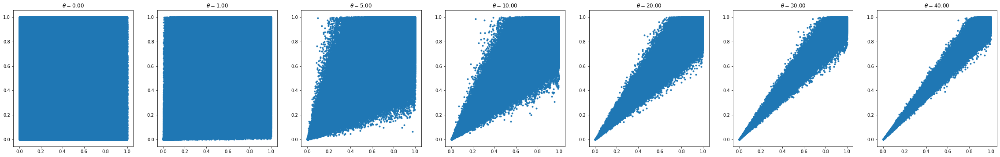

In [5]:
r= 40
fig, ax = plt.subplots(1, len(theta_arr), 
                       gridspec_kw={
                           'width_ratios': [1 for _ in range(len(theta_arr))],
                           'height_ratios': [1]}, figsize=(r,r/len(theta_arr)))

for i, data in enumerate(uv):
    ax[i].scatter(data[0], data[1], marker='.')
    ax[i].set_title(r"$\theta=$%.2f"%theta_arr[i])

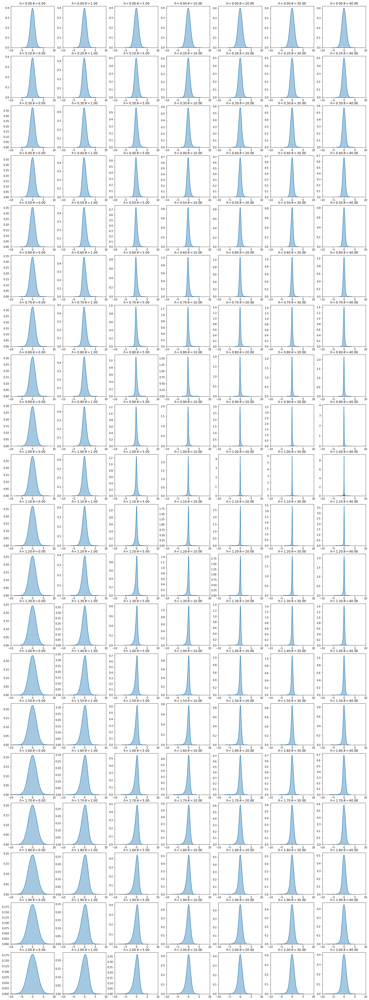

In [6]:
r=500
fig, ax = plt.subplots(len(h_arr), len(theta_arr), 
                       gridspec_kw={
                           'width_ratios': [1 for _ in range(len(theta_arr))],
                           'height_ratios': [1 for _ in range(len(h_arr))]}, figsize=(r/len(h_arr),r/len(theta_arr)))


for i, h in enumerate(h_arr):
    for j, theta in enumerate(theta_arr):
        sns.distplot(results.iloc[i,j],ax=ax[i][j])
        ax[i][j].set_xlim((-10,10))
#         ax[i][j].set_ylim((0,5))
        ax[i][j].set_title(r"$h=$%.2f $\theta=$%.2f"%(h,theta))


In [7]:
def exponential_risk_measure_sample(k, x):  
    # K: Absolute Risk Aversion 
    # x: Return
    Nq = 1000
    qs=np.linspace(0,1, Nq+1, endpoint=True)
    dqs = 1/Nq
    quantiles = np.quantile(x, qs)
    intergand = (k*np.exp(-k*qs)/(1-np.exp(-k)))*quantiles
    return -np.sum((intergand[1:]+intergand[:-1]))* dqs /2

In [8]:
# PLAY AROUND WITH DIFFERENT k!
k = 0.025
fn = partial(exponential_risk_measure_sample, k=k)
ERM_results= results.applymap(lambda rv:fn(x=rv))
ERM_results.style.highlight_min(color = 'lightgreen', axis = 0)

theta,0.0001,1.0,5.0,10.0,20.0,30.0,40.0
h,,,,,,,
0.0,0.00563871,0.00722603,0.00852683,0.00720401,0.00720914,0.00568782,0.00558859
0.2,0.00593768,0.00613701,0.00694442,0.00565244,0.00570209,0.00459957,0.00439002
0.3,0.00625817,0.00563073,0.00616108,0.0049097,0.00495881,0.0040609,0.00380821
0.4,0.00670452,0.00536306,0.00542504,0.00419028,0.00420175,0.00353807,0.00322162
0.5,0.00720592,0.0052236,0.00472917,0.00348807,0.00344516,0.00298461,0.00264033
0.6,0.0077701,0.00514419,0.00433059,0.00291291,0.00271965,0.00244001,0.00207468
0.7,0.008356,0.00511805,0.00395062,0.0025556,0.00242816,0.00210815,0.00168246
0.8,0.00900346,0.00519113,0.0036793,0.00221356,0.0020363,0.00187374,0.00152667
0.9,0.00964639,0.00530795,0.00354611,0.00203923,0.00175005,0.00163154,0.00128188


In [9]:
ERM_results_toplot = ERM_results.unstack().reset_index()
ERM_results_toplot.columns = ['theta', 'h', 'ERM']

fig = px.line_3d(ERM_results_toplot, x="theta", y="h", z="ERM", color = 'theta', 
                 color_discrete_sequence=px.colors.sequential.ice)

fig.update_layout(
    title={
        'text': "ERM, k=%.2f"%k,
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})
fig.update_scenes(xaxis_autorange="reversed")

fig.show()

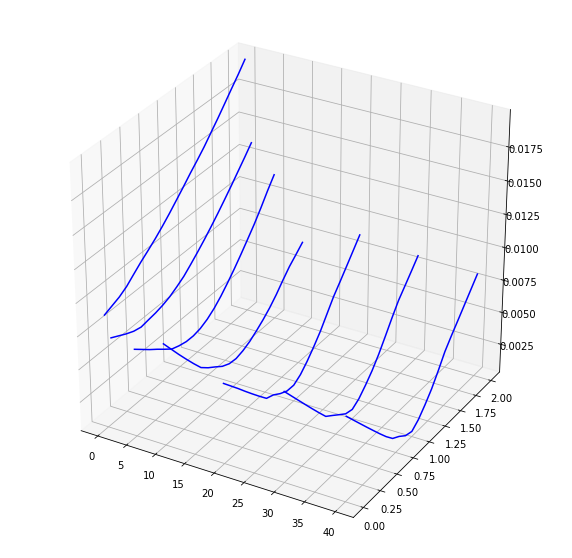

In [555]:
fig = plt.figure(figsize=(10,10))
ax = fig.gca(projection='3d')

for i in range(len(ERM_results.columns)):
    z = ERM_results.iloc[:,i]
    x = np.ones(len(ERM_results))*ERM_results.columns[i]
    y = ERM_results.index
    ax.plot(x, y, z, color='blue')
plt.show()

In [445]:
# PLAY AROUND WITH DIFFERENT k!
k=1
fn = partial(exponential_risk_measure_sample, k=k)
ERM_results = results.applymap(lambda rv:fn(x=rv))
ERM_results.style.highlight_min(color = 'lightgreen', axis = 0)

theta,0.0001,1.0,5.0,10.0,20.0,30.0,40.0
h,,,,,,,
0.0,0.280045,0.281998,0.27275,0.275308,0.279723,0.278937,0.283969
0.2,0.286147,0.256818,0.22488,0.222737,0.224717,0.223508,0.227434
0.3,0.293075,0.248195,0.202295,0.197033,0.19741,0.195896,0.199222
0.4,0.302529,0.242686,0.181238,0.17202,0.170341,0.168413,0.171102
0.5,0.314199,0.240238,0.162492,0.14808,0.143747,0.141175,0.143116
0.6,0.327905,0.241151,0.146848,0.126053,0.117939,0.114417,0.115394
0.7,0.343404,0.245421,0.135199,0.107202,0.0943351,0.0887714,0.0885461
0.8,0.360452,0.252901,0.128854,0.0929414,0.0734682,0.0652658,0.063396
0.9,0.378919,0.26327,0.128708,0.0857882,0.0586716,0.0464589,0.0418396


In [426]:
# PLAY AROUND WITH DIFFERENT k!
k = 400000000
fn = partial(exponential_risk_measure_sample, k=k)
ERM_results = results.applymap(lambda rv:fn(x=rv))
ERM_results.style.highlight_min(color = 'lightgreen', axis = 0) 

theta,0.0001,1.0,5.0,10.0,20.0,30.0,40.0
h,,,,,,,
0.0,859357,866406,834537,873257,824335,914580,855312
0.2,880750,693901,669416,697216,659024,731685,683533
0.3,895768,668893,586855,609196,576368,640237,597643
0.4,910785,714997,505599,521176,493713,548789,511753
0.5,925802,761101,481361,433156,411058,457342,425863
0.6,955958,807206,520150,373244,328402,365894,339973
0.7,1.0029e+06,853310,584599,437081,410734,328073,317696
0.8,1.04984e+06,899414,657409,500919,504913,405023,410125
0.9,1.10933e+06,948046,730218,564756,599092,481972,502553


In [564]:
# PLAY AROUND WITH DIFFERENT k!
k=-0.1
fn = partial(exponential_risk_measure_sample, k=k)
ERM_results = results.applymap(lambda rv:fn(x=rv))
ERM_results.style.highlight_min(color = 'lightgreen', axis = 0) 

theta,0.0001,1.0,5.0,10.0,20.0,30.0,40.0
h,,,,,,,
0.0,-0.0265044,-0.0280016,-0.0283658,-0.0273307,-0.0288813,-0.0281628,-0.0285492
0.2,-0.0267499,-0.0256901,-0.0232857,-0.0224054,-0.0233118,-0.0227972,-0.0230629
0.3,-0.0272601,-0.024948,-0.0209017,-0.0200014,-0.0205865,-0.0201284,-0.0203289
0.4,-0.027931,-0.0244417,-0.0187379,-0.0176716,-0.0178824,-0.0174759,-0.0176009
0.5,-0.0288975,-0.024093,-0.0168179,-0.01545,-0.0152282,-0.0148495,-0.014889
0.6,-0.0301734,-0.0241511,-0.0150301,-0.0131815,-0.0126627,-0.0122681,-0.0121984
0.7,-0.031649,-0.0245444,-0.0136395,-0.0111804,-0.00989301,-0.00948198,-0.00951875
0.8,-0.0332658,-0.0252563,-0.0127114,-0.00972301,-0.00763244,-0.0069632,-0.00675056
0.9,-0.0350109,-0.0262148,-0.0123433,-0.0088818,-0.00594167,-0.0049788,-0.00451517


In [561]:
# Variance as risk measure
variance_results = results.applymap(np.var)
variance_results.style.highlight_min(color = 'lightgreen', axis = 0) 

theta,0.0001,1.0,5.0,10.0,20.0,30.0,40.0
h,,,,,,,
0.0,1.00197,0.997688,0.99898,1.00085,0.998343,1.00119,0.997451
0.2,1.0424,0.838849,0.694302,0.66672,0.650546,0.647888,0.64345
0.3,1.09266,0.789372,0.572,0.529651,0.506602,0.501292,0.496371
0.4,1.16295,0.759856,0.469722,0.412579,0.382628,0.374735,0.36924
0.5,1.25326,0.750301,0.387469,0.315505,0.278624,0.268216,0.262057
0.6,1.3636,0.760708,0.325241,0.238428,0.19459,0.181735,0.174821
0.7,1.49397,0.791077,0.283038,0.181349,0.130526,0.115292,0.107533
0.8,1.64436,0.841407,0.260859,0.144267,0.086431,0.0688874,0.0601929
0.9,1.81479,0.911698,0.258704,0.127183,0.0623063,0.0425208,0.0328004


In [566]:
variance_results_toplot

,theta,h,variance
0,0.0001,0.0,1.001967
1,0.0001,0.2,1.042404
2,0.0001,0.3,1.092663
3,0.0001,0.4,1.162949
4,0.0001,0.5,1.253263
5,0.0001,0.6,1.363603
6,0.0001,0.7,1.493970
7,0.0001,0.8,1.644364
8,0.0001,0.9,1.814785
9,0.0001,1.0,2.005234


In [569]:
variance_results_toplot = variance_results.unstack().reset_index()
variance_results_toplot.columns = ['theta', 'h', 'variance']

fig = px.line_3d(variance_results_toplot, x="theta", y="h", z="variance", color = 'theta', 
                 color_discrete_sequence=px.colors.sequential.ice)

fig.update_layout(
    title={
        'text': "variance by sampling",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})
fig.update_scenes(xaxis_autorange="reversed")

fig.show()

In [562]:
# Expected Shortfall
def expected_shortfall_sample(alpha, x):
    return -np.mean(x[x <= np.quantile(a=x, q=alpha)])

ES_results = results.applymap(lambda x: expected_shortfall_sample(alpha=0.2, x=x))
ES_results.style.highlight_min(color = 'lightgreen', axis = 0) 

theta,0.0001,1.0,5.0,10.0,20.0,30.0,40.0
h,,,,,,,
0.0,1.40302,1.3979,1.39969,1.40072,1.39829,1.4001,1.39811
0.2,1.43138,1.24446,1.13131,1.12337,1.11936,1.12037,1.11868
0.3,1.46553,1.19028,1.00141,0.985402,0.980054,0.98058,0.979007
0.4,1.51196,1.15488,0.8784,0.848659,0.84094,0.840869,0.839377
0.5,1.5696,1.1408,0.768132,0.715515,0.702348,0.701323,0.699824
0.6,1.63731,1.14973,0.678561,0.591598,0.565801,0.562495,0.560603
0.7,1.71382,1.1821,0.618889,0.486921,0.43602,0.426751,0.423089
0.8,1.79801,1.23649,0.59983,0.4159,0.32437,0.301195,0.291892
0.9,1.88888,1.30898,0.631403,0.399596,0.255435,0.206328,0.182537


In [574]:
ES_results_toplot = ES_results.unstack().reset_index()
ES_results_toplot.columns = ['theta', 'h', 'ES']

fig = px.line_3d(ES_results_toplot, x="theta", y="h", z="ES", color = 'theta', 
                 color_discrete_sequence=px.colors.sequential.ice)

fig.update_layout(
    title={
        'text': "Expected Shortfall by sampling",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})
fig.update_scenes(xaxis_autorange="reversed")
fig.show()

theta = -0.1 start


/Users/francis/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning:

divide by zero encountered in power



theta = 1 start


/Users/francis/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning:

overflow encountered in power

/Users/francis/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:23: RuntimeWarning:

divide by zero encountered in reciprocal

/Users/francis/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning:

invalid value encountered in multiply

/Users/francis/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning:

overflow encountered in multiply



theta = 5 start


/Users/francis/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:23: RuntimeWarning:

divide by zero encountered in power

/Users/francis/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:23: RuntimeWarning:

overflow encountered in power



theta = 10 start
theta = 20 start
done!


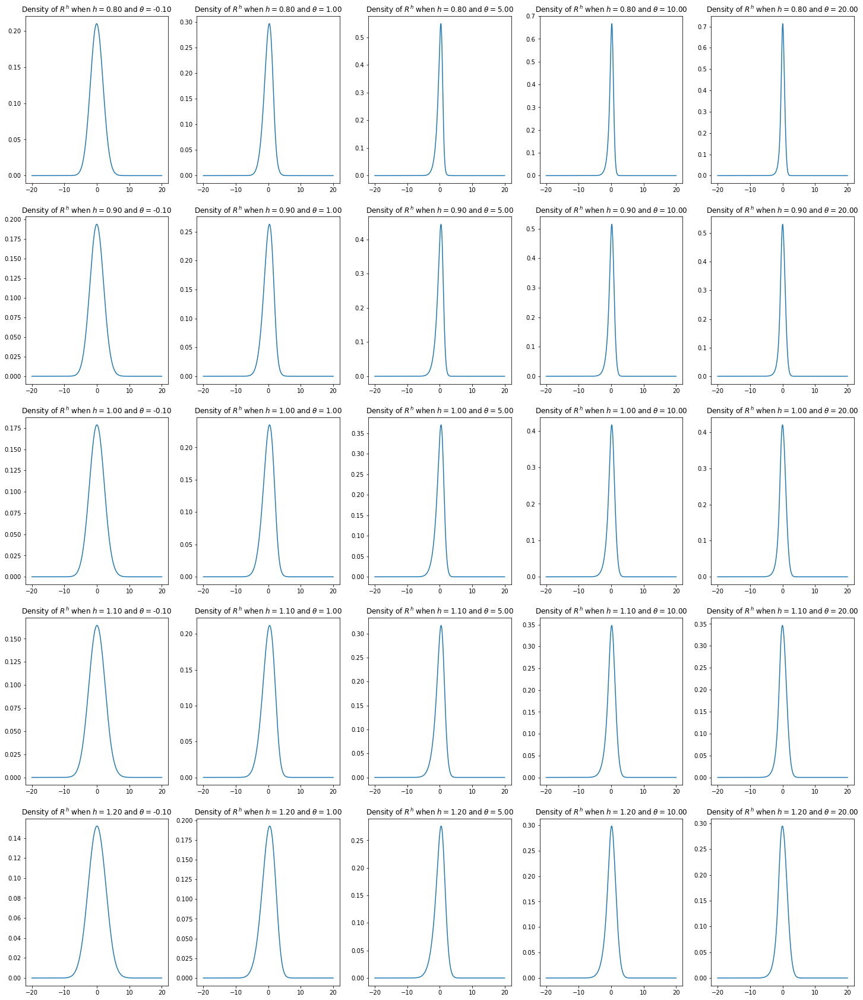

In [58]:
nS = 1

Law_RS = stats.norm(loc = 0, scale = 1)
Law_RF = stats.norm(loc = 0, scale = 2)

ny = 1000
y1 = np.linspace(-20,20,ny)

# optimization
fn = partial(f_Z_2, nS=nS, nF=nF, Law_RS= Law_RS, Law_RF=Law_RF, theta=theta)
v_fn = np.vectorize(fn)

# saving results
h_totable = []
theta_totable = []
pdfs_totable = []

# Plot
r=20  # raito for plotting
fig = plt.figure(figsize=(len(h_arr)*r,len(theta_arr)*r))
for i, theta in enumerate(theta_arr):
    print('theta =', theta, "start")
    for k, h in enumerate(h_arr):
        h_totable.append(h)
        nF = -h 
        
        theta_totable.append(theta)
        
        fn = partial(f_Z_2, nS=nS, nF=nF, Law_RS= Law_RS, Law_RF=Law_RF, theta=theta)
        v_fn = np.vectorize(fn)
        pdf = v_fn(y1)
        pdfs_totable.append(pdf)
        
        fig.add_subplot(len(h_arr),len(theta_arr),i+((k+0)*len(theta_arr)))
        plt.title(r"Density of $R^h$ when $h=$%.2f and $\theta=$%.2f"%(h, theta))
        plt.plot(y1, pdf)
print('done!')

## Retrieve the spectral risk measure from PDF
The spectral risk measure we are considering is exponental risk meausre
$$
\text{ERM}(R^h) = -\int_0^1 \frac{ke^{-ks}}{1-e^{-k}}q_s(R^h)ds
$$

$k>0$ is the Arrow-Pratt coefficient of absolute risk aversion.

$q_s(R^h)$ is the $s^{th}$ quantile of $R^h$.

Quantile function is the inverse of CDF. We need to get the CDF from PDF.

__DO LOOK FOR LITERATURE ABOUT HOW TO GET RISK MEASURE FROM NUMERICAL PDF!!__

In [134]:
def exponential_risk_measure(k, x, density):
    # k: absolute risk aversion
    # x: variable
    # density: variable's corresponding density
    pdf = pd.DataFrame({'x':x, 'density':density}) 
    pdf.loc[:,'dx'] = (pdf.x - pdf.x.shift(1))
    
    cdf = np.cumsum(pdf.density[:-1]+ pdf.density[1:]) * pdf.dx[1:]/2
    cdf = pd.DataFrame({'x':y1, 'prob':cdf}) 
    cdf.loc[:,'d_prob'] = cdf.prob - cdf.prob.shift(1)
    cdf.loc[:,'intergrand'] = (k*np.exp(-k*cdf.prob)/(1-np.exp(-k)))*cdf.x
    return -np.nansum((cdf.intergrand[1:]+ cdf.intergrand[:-1])*cdf.d_prob/2)

ERM = []
k = 20
for density in pdfs_totable:
    ERM.append(exponential_risk_measure(k, y1, density))

In [135]:
result_toplot = pd.DataFrame({'h':h_totable, 'theta':theta_totable, 'ERM':ERM})

In [136]:
result_toploty = pd.pivot_table(result_toplot, values='ERM', index='h', columns = 'theta')

In [137]:
result_toploty

theta,-0.1,1.0,5.0,10.0,20.0
h,,,,,
0.8,3.625789,2.769674,2.002886,1.703863,1.462452
0.9,3.901931,3.099543,2.344360,2.048930,1.810811
1.0,4.211309,3.436943,2.691690,2.399452,2.164366
1.1,4.538109,3.779987,3.043275,2.753857,2.521510
1.2,4.874515,4.127367,3.398053,3.111128,2.881238


- include more h, include 0 as well
- no negative value for theta of Clayton

In [124]:
import plotly.graph_objects as go
from plotly.offline import init_notebook_mode, iplot
import plotly.offline as pyo
pyo.init_notebook_mode()
# fig = go.Figure(data=[go.Surface(z=result_toplot.ERM,x=result_toplot.h, y= result_toplot.theta)])
fig = go.Figure(data=[go.Surface(x=h_arr,y=theta_arr,z=result_toploty.values)])

fig.update_layout(scene = dict(
                    xaxis_title='h',
                    yaxis_title='theta',
                    zaxis_title='ERM'))
iplot(fig)